In [43]:
%pip install numpy matplotlib imageio tifffile Pillow scipy scikit-image ipython

Note: you may need to restart the kernel to use updated packages.


In [44]:
from __future__ import annotations
from dataclasses import dataclass
from pathlib import Path
from typing import Tuple
import numpy as np
import matplotlib.pyplot as plt
import imageio.v3 as iio
import tifffile as tiff
from PIL import Image
from IPython.display import display
from scipy.ndimage import gaussian_filter
from scipy import ndimage as ndi
from skimage.morphology import remove_small_objects, disk, opening, closing
from skimage.segmentation import clear_border
from typing import List, Tuple, Dict, Optional




In [89]:



def find_project_root(start: Path | None = None) -> Path:
    """Find nearest parent containing 'pictures' folder."""
    p = (start or Path.cwd()).resolve()
    for cur in [p, *p.parents]:
        if (cur / "pictures").exists():
            return cur
    return p


def read_image_any(path: Path) -> np.ndarray: #将图片变成numpy数组
    """Read .tif/.tiff via tifffile; other formats via imageio."""
    path = Path(path)
    ext = path.suffix.lower()
    if ext in {".tif", ".tiff"}:
        img = tiff.imread(str(path))
    else:
        img = iio.imread(path)

    img = np.asarray(img)
    if img.ndim == 3 and img.shape[-1] == 4:  # RGBA -> RGB
        img = img[..., :3]
    return img


def _to_float01(img: np.ndarray) -> np.ndarray: # 将图片数据转换为0-1范围的浮点数
    img = np.asarray(img)
    if img.ndim == 2:
        img = np.stack([img, img, img], axis=-1)
    if img.ndim == 3 and img.shape[-1] == 4:
        img = img[..., :3]
    if img.ndim != 3 or img.shape[-1] != 3:
        raise ValueError(f"Expect RGB image, got {img.shape}")

    if np.issubdtype(img.dtype, np.floating): # 如果已经是浮点数类型，检查是否需要缩放
        x = img.astype(np.float32, copy=False)
        if np.nanmax(x) > 1.0:
            x = x / 255.0
    else:
        x = img.astype(np.float32) / 255.0
    return np.clip(x, 0.0, 1.0)


def save_png(img: np.ndarray, out_path: Path) -> None: # 将图像保存为PNG格式
    out_path = Path(out_path)
    out_path.parent.mkdir(parents=True, exist_ok=True)
    iio.imwrite(str(out_path), img, extension=".png")

def slider_c(val: float) -> float:
    """val in [-100,100] -> c in [-1,1]"""
    return float(np.clip(val, -100, 100) / 100.0)

def slider_factor(val: float) -> float:
    """val in [-100,100] -> factor in [0,2]"""
    c = slider_c(val)
    return float(np.clip(1.0 + c, 0.0, 2.0))
def rgb_to_luma(img01: np.ndarray) -> np.ndarray:
    return (0.2126 * img01[..., 0] +
            0.7152 * img01[..., 1] +
            0.0722 * img01[..., 2])

def adjust_clarity_luma(img01: np.ndarray, clarity: float, sigma: float = 2.0) -> np.ndarray:
    c = slider_c(clarity)  # [-1,1]
    L = rgb_to_luma(img01)                      # (H,W)
    L_blur = gaussian_filter(L, sigma=sigma)    # (H,W)
    L2 = np.clip(L + c * (L - L_blur), 0.0, 1.0)
    eps = 1e-6
    ratio = (L2 + eps) / (L + eps)              # (H,W)
    out = img01 * ratio[..., None]
    return np.clip(out, 0.0, 1.0)

def adjust_brightness(img01: np.ndarray, brightness: float) -> np.ndarray:
    f = slider_factor(brightness)
    return np.clip(img01 * f, 0.0, 1.0)
def adjust_highlights(img01: np.ndarray, highlights: float) -> np.ndarray:
    f = slider_factor(highlights)
    out = img01 + (1.0 - img01) * (f - 1.0)
    return np.clip(out, 0.0, 1.0)

def adjust_contrast(img01: np.ndarray, contrast: float) -> np.ndarray:
    f = slider_factor(contrast)
    return np.clip((img01 - 0.5) * f + 0.5, 0.0, 1.0)

def adjust_saturation(img01: np.ndarray, saturation: float) -> np.ndarray:
    f = slider_factor(saturation)
    luma = (0.2126 * img01[..., 0] + 0.7152 * img01[..., 1] + 0.0722 * img01[..., 2])[..., None]
    out = luma + (img01 - luma) * f
    return np.clip(out, 0.0, 1.0)

def adjust_warmth(img01: np.ndarray, warmth: float) -> np.ndarray:
    c = slider_c(warmth)
    r_factor = float(np.clip(1.0 + c, 0.0, 2.0))
    b_factor = float(np.clip(1.0 - c, 0.0, 2.0))

    out = img01.copy()
    out[..., 0] = np.clip(out[..., 0] * r_factor, 0.0, 1.0)  # R
    out[..., 2] = np.clip(out[..., 2] * b_factor, 0.0, 1.0)  # B
    return out

def apply_sliders(img: np.ndarray, clarity=0, brightness=0, contrast=0, saturation=0, highlights=0, warmth=0, debug=False):
    x = _to_float01(img)
    x = adjust_clarity_luma(x, clarity=clarity, sigma=2.0)
    x = adjust_brightness(x, brightness)
    x = adjust_contrast(x, contrast)
    x = adjust_highlights(x, highlights)
    x = adjust_saturation(x, saturation)
    x = adjust_warmth(x, warmth)
    return x

def fill_black_holes(mask: np.ndarray, max_hole_area: int | None = None) -> np.ndarray:
    m = mask.astype(bool)
    filled_all = ndi.binary_fill_holes(m)

    if max_hole_area is None:
        return filled_all

    holes = filled_all & (~m)          # pixels that would be added to foreground
    if not holes.any():
        return m

    lab, n = ndi.label(holes)
    if n == 0:
        return m

    counts = np.bincount(lab.ravel())  # counts[0] is background
    small_ids = np.where(counts <= max_hole_area)[0]
    small_ids = small_ids[small_ids != 0]

    if small_ids.size == 0:
        return m

    small_holes = np.isin(lab, small_ids)
    return m | small_holes

def denoise_mask_conservative(mask_filled: np.ndarray,
                              min_obj_area: int = 12,
                              drop_border: bool = False) -> np.ndarray:
    m = mask_filled.astype(bool)
    
    if drop_border:
        m = clear_border(m)
    m = remove_small_objects(m, min_size=min_obj_area, connectivity=2)
    
    return m.astype(bool)

def find_centroids(
    mask: np.ndarray,
    *,
    labeled: bool = False,
    connectivity: int = 2,
    min_area: int = 1,
    return_labels: bool = False,
) -> List[Tuple[float, float]] | Tuple[List[Tuple[float, float]], np.ndarray]:

    mask = np.asarray(mask)

    if labeled:
        labels_img = mask.astype(np.int32, copy=False)
        if labels_img.ndim != 2:
            raise ValueError("label image must be 2D")
    else:
        if mask.ndim != 2:
            raise ValueError("binary mask must be 2D")
        # treat anything >0 as foreground
        fg = mask > 0
        # connectivity structure
        structure = ndi.generate_binary_structure(rank=2, connectivity=connectivity)
        labels_img, _ = ndi.label(fg, structure=structure)

    if labels_img.max() == 0:
        out = ([], labels_img) if return_labels else []
        return out

    # compute areas per label
    counts = np.bincount(labels_img.ravel())
    # labels are 1..K
    keep = [lab for lab in range(1, len(counts)) if counts[lab] >= int(min_area)]

    if len(keep) == 0:
        out = ([], labels_img) if return_labels else []
        return out

    # center_of_mass returns (cy, cx)
    centroids = ndi.center_of_mass(np.ones_like(labels_img, dtype=np.float32), labels_img, keep)
    centroids = [(float(cy), float(cx)) for (cy, cx) in centroids]

    if return_labels:
        return centroids, labels_img
    return centroids

def centroids_to_image(
    centroids: list[tuple[float, float]],
    shape: tuple[int, int],
    *,
    radius: int = 2,
    value: int = 255,
) -> np.ndarray:

    h, w = shape
    img = np.zeros((h, w), dtype=np.uint8)

    for cy, cx in centroids:
        y = int(round(cy))
        x = int(round(cx))
        if not (0 <= y < h and 0 <= x < w):
            continue

        if radius <= 0:
            img[y, x] = value
            continue

        y0, y1 = max(0, y - radius), min(h, y + radius + 1)
        x0, x1 = max(0, x - radius), min(w, x + radius + 1)
        yy, xx = np.ogrid[y0:y1, x0:x1]
        disk = (yy - y) ** 2 + (xx - x) ** 2 <= radius ** 2
        img[y0:y1, x0:x1][disk] = value

    return img

def centroids_points_image(
    centroids: list[tuple[float, float]],
    shape: tuple[int, int],
    *,
    radius: int = 2,
) -> np.ndarray:

    h, w = shape
    img = np.full((h, w), 255, dtype=np.uint8)

    for cy, cx in centroids:
        y = int(round(cy))
        x = int(round(cx))
        if not (0 <= y < h and 0 <= x < w):
            continue

        if radius <= 0:
            img[y, x] = 0
            continue

        y0, y1 = max(0, y - radius), min(h, y + radius + 1)
        x0, x1 = max(0, x - radius), min(w, x + radius + 1)
        yy, xx = np.ogrid[y0:y1, x0:x1]
        disk = (yy - y) ** 2 + (xx - x) ** 2 <= radius ** 2
        img[y0:y1, x0:x1][disk] = 0

    return img


C:\Users\qq187\AppData\Local\Temp\ipykernel_106076\3727125398.py:141: FutureWarning: Parameter `min_size` is deprecated since version 0.26.0 and will be removed in 2.0.0 (or later). To avoid this warning, please use the parameter `max_size` instead. For more details, see the documentation of `remove_small_objects`. Note that the new threshold removes objects smaller than **or equal to** its value, while the previous parameter only removed smaller ones.
  m = remove_small_objects(m, min_size=min_obj_area, connectivity=2)


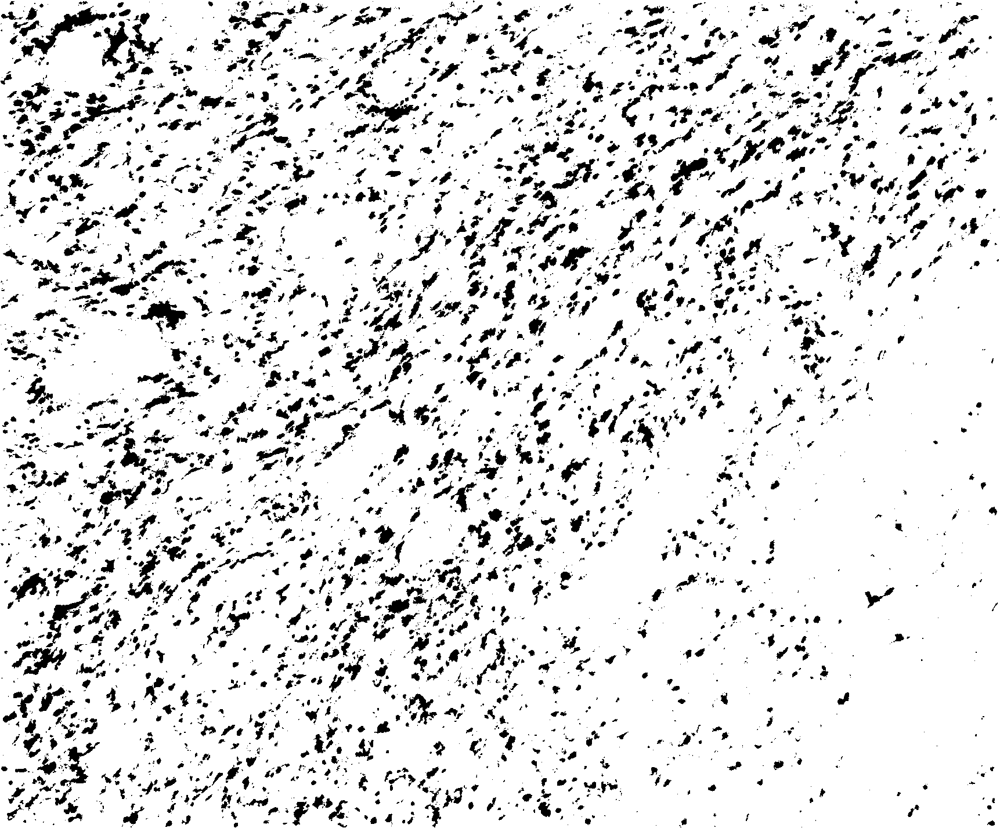

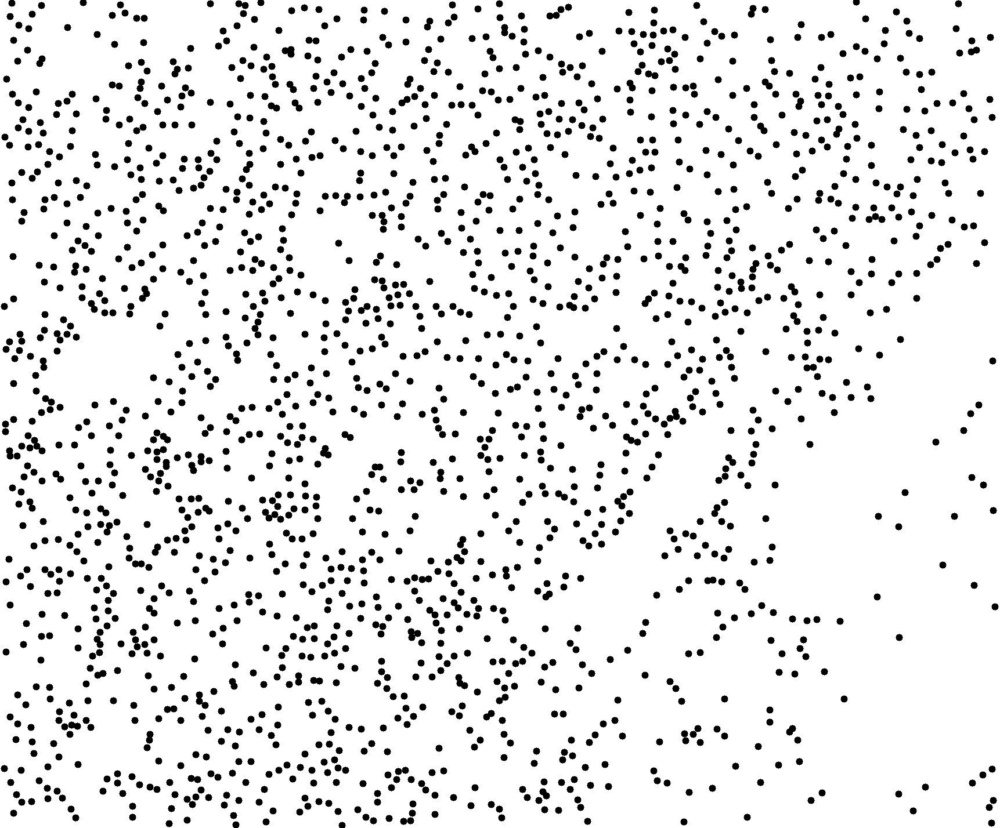

In [ ]:
#test the code's effectiveness
"import img and define roots"
root = find_project_root()
in_path = root / "pictures"/ "pictures_in" / "228534_1.tif"
img = read_image_any(in_path)
"change threshold"
out_change_threshold = apply_sliders(
    img,
    clarity=-22,      # -100..100
    brightness=70, 
    highlights=-100,   # -100..100
    contrast=99,
    saturation=-99,
    warmth=0
)
"RGB to binary mask"
gray = 0.2126*out_change_threshold[..., 0] + 0.7152*out_change_threshold[..., 1] + 0.0722*out_change_threshold[..., 2]
T = 0.5 
img = gray < T  
"fill holds, denoise, find centroids. apply as needed #out if dont need it"
img= fill_black_holes(img, max_hole_area=100)
img = denoise_mask_conservative(img,min_obj_area=0.04,drop_border=True)
H, W = img.shape
points = centroids_points_image(find_centroids(img, min_area=20), (H, W), radius=6)
display(Image.fromarray((~img).astype(np.uint8) * 255, mode="L"))
display(Image.fromarray(points, mode="L"))

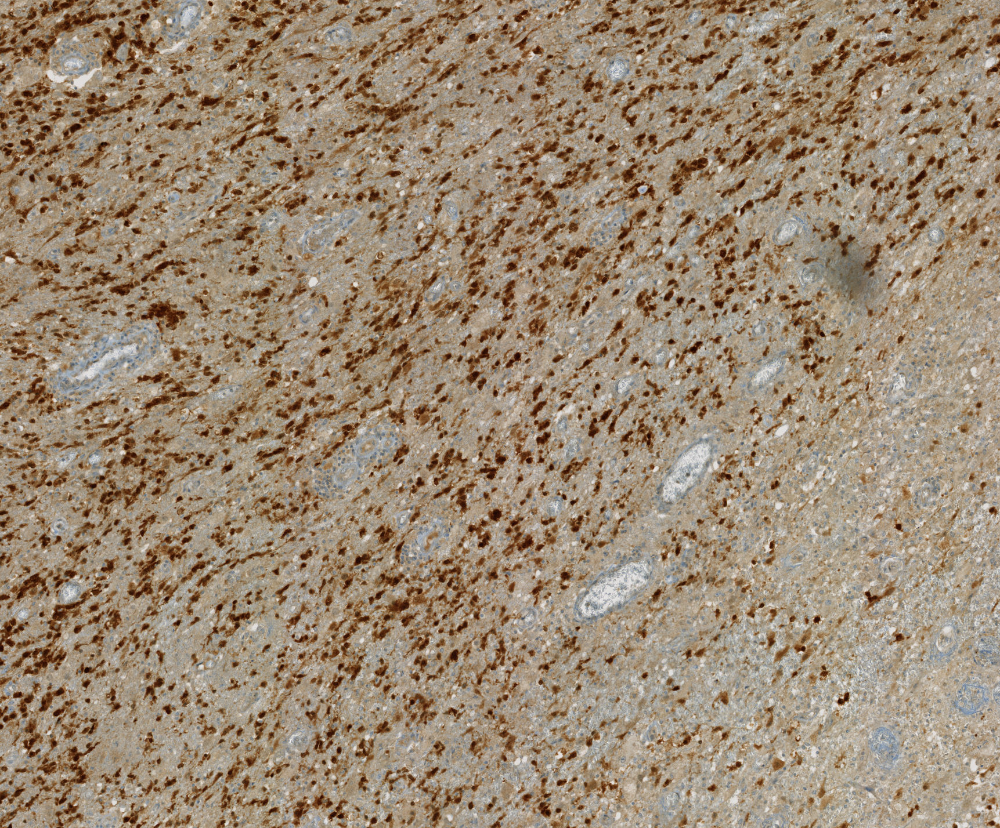

In [47]:
#read picture even it's tiff
root = find_project_root()
in_path = root / "pictures"/ "pictures_in" / "228534_1.tif"
img = read_image_any(in_path)
display(Image.fromarray(img))